In [1]:
import pandas as pd
import matplotlib
from matplotlib import pyplot as plt
import seaborn
from sklearn.tree import DecisionTreeRegressor

In [2]:
LABEL_END_COL = 5
MISSING = "Missing Scheme Detailed: SPSS"
LEVEL = "Level"
VARIABLE = "Variable"
FIELDS = ["finalscorealgebra", "finalscoredat", "finalscoregeo", "finalscorenum"]
SCORES = ["finalscore", "totalscore"]
CORRELATION_METHODS = ["pearson", "spearman"]

## laod dataset

In [3]:
df = pd.read_excel("data/TIMSS2019.xlsx")
codebook = pd.ExcelFile("data/T2019_G8_Codebook.xlsx")

sheets = []
for sheet_name in codebook.sheet_names:
    sheet = pd.read_excel(codebook, sheet_name, usecols=[MISSING, LEVEL, VARIABLE])
    sheet[MISSING] = sheet[MISSING].map(lambda e: int(e[: e.index(":")]))
    sheets.append(sheet)

variables_info = pd.concat(sheets).transpose()
variables_info.columns = variables_info.loc[VARIABLE]
variables_info.drop(VARIABLE, inplace=True)
variables_info

Variable,IDCNTRY,IDSCHOOL,BCBG03A,BCBG03B,BCBG04,BCBG05A,BCBG05B,BCBG06A,BCBG06B,BCBG06C,...,BTBGTJS,BTDGEAS,BTDGLSN,BTDGSOS,BTDGTJS,BTDMMME,BTDMNUM,BTDMALG,BTDMGEO,BTDMDAT
Level,Nominal,Not defined,Nominal,Nominal,Nominal,Nominal,Nominal,Nominal,Nominal,Nominal,...,Scale,Ordinal,Ordinal,Ordinal,Ordinal,Ordinal,Ratio,Ratio,Ratio,Ratio
Missing Scheme Detailed: SPSS,9999999999,9999,9,9,9,99,9,999,999,9,...,999999,9,9,9,9,9,999,999,999,999


# fill missing values

In [4]:
df = df.iloc[:, 5:].copy()

for col in df.keys():
    if col in variables_info.keys():
        level, missing_value = variables_info[col][[LEVEL, MISSING]]
        col_values = df[df[col] != missing_value][col]
        if level == "Nominal":
            mode = float(col_values.mode()[0])
            df[col].replace(missing_value, mode, inplace=True)
            df[col].fillna(mode, inplace=True)
        else:
            median = float(col_values.median())
            df[col].replace(missing_value, median, inplace=True)
            df[col].fillna(median, inplace=True)

df.dropna(inplace=True)
df

,finalscore,totalscore,finalscorealgebra,finalscoredat,finalscoregeo,finalscorenum,BSBG01,BSBG03,BSBG04,BSBG05A,...,BTBM23,BTDGEAS,BTDGLSN,BTDGSOS,BTDGTJS,BTDMMME,BTDMNUM,BTDMALG,BTDMGEO,BTDMDAT
0,D,14.0,A,D,E,E,1,2,3,1,...,5,3,2,1,1,2,100.0,28.57143,83.33333,83.33333
1,D,11.0,D,D,E,D,1,1,3,1,...,5,3,2,1,1,2,100.0,28.57143,83.33333,83.33333
2,B,31.0,B,D,C,B,1,1,4,1,...,5,3,2,1,1,2,100.0,28.57143,83.33333,83.33333
3,E,6.0,D,E,E,E,1,1,2,2,...,4,2,2,2,2,3,100.0,28.57143,83.33333,16.66667
4,D,15.0,D,C,E,D,1,1,2,1,...,4,2,2,2,2,3,100.0,28.57143,83.33333,16.66667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5970,D,16.0,D,D,D,D,2,2,2,2,...,2,3,3,1,1,2,100.0,28.57143,100.00000,83.33333
5971,D,9.0,E,E,C,E,1,4,1,2,...,5,3,2,2,1,2,100.0,71.42857,100.00000,83.33333
5972,E,7.0,E,E,D,E,1,3,2,1,...,5,3,2,2,1,2,100.0,71.42857,100.00000,83.33333
5973,D,9.0,E,E,C,E,2,1,5,1,...,4,3,3,2,3,2,100.0,14.28571,83.33333,66.66667


# plot whisker boxes


<Figure size 1440x1440 with 0 Axes>

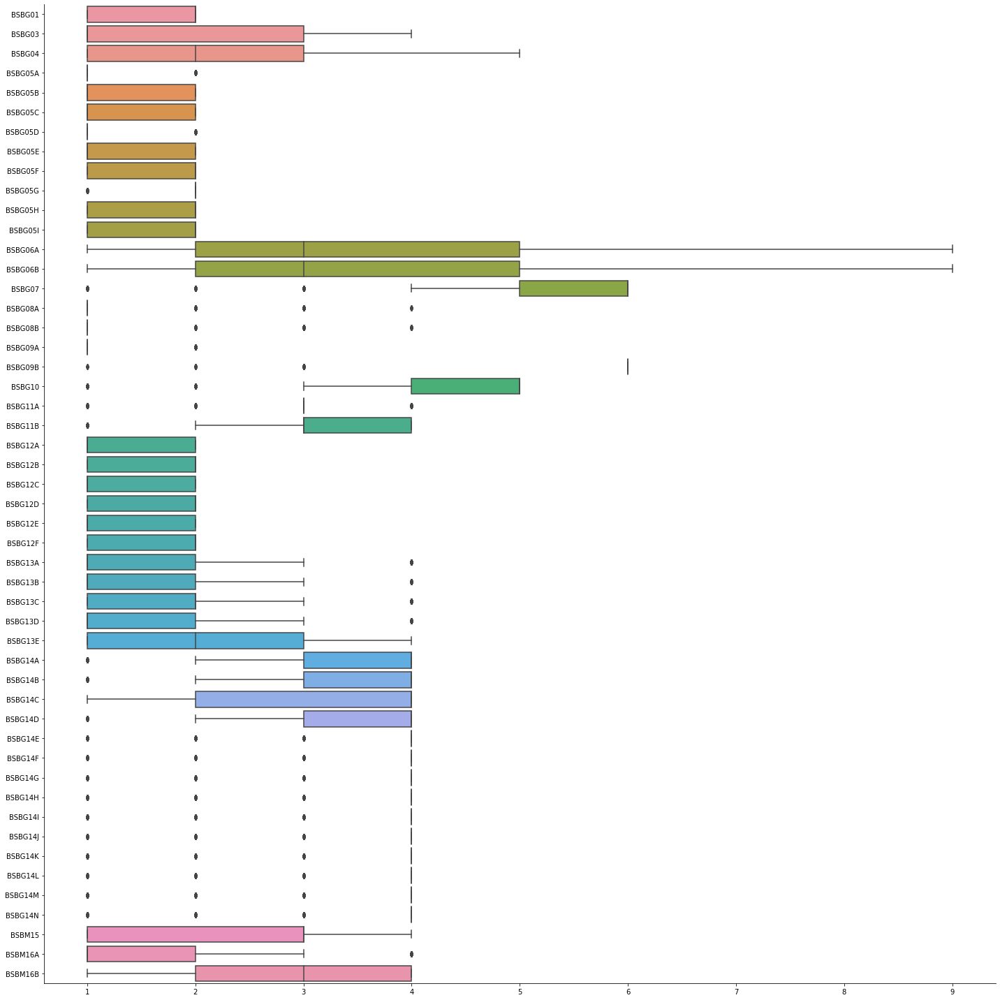

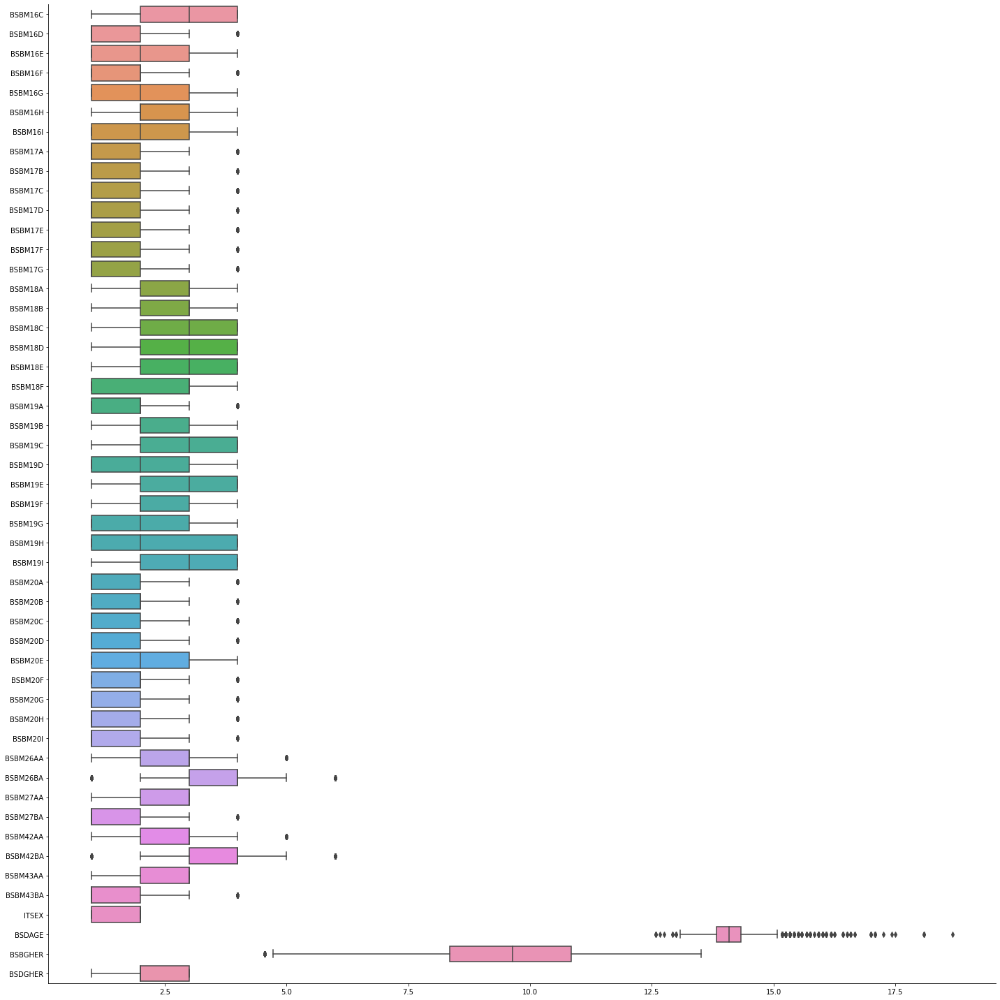

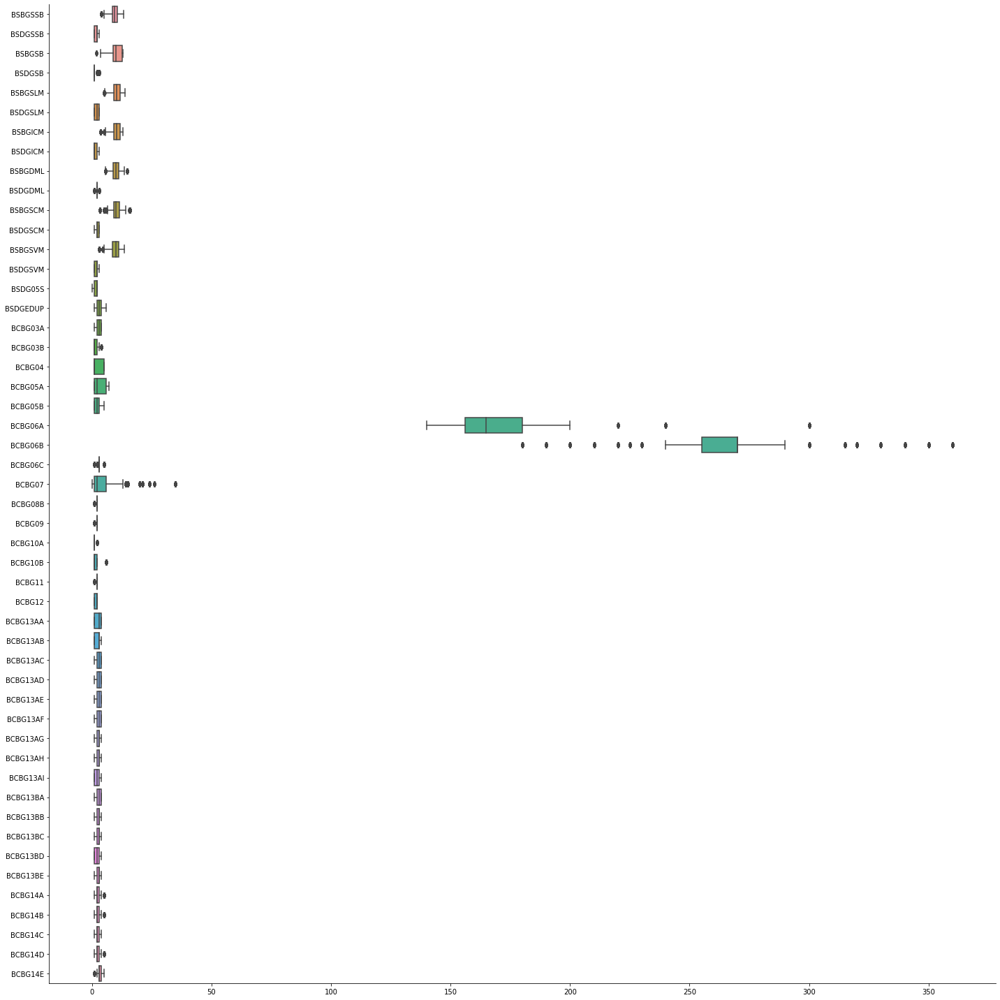

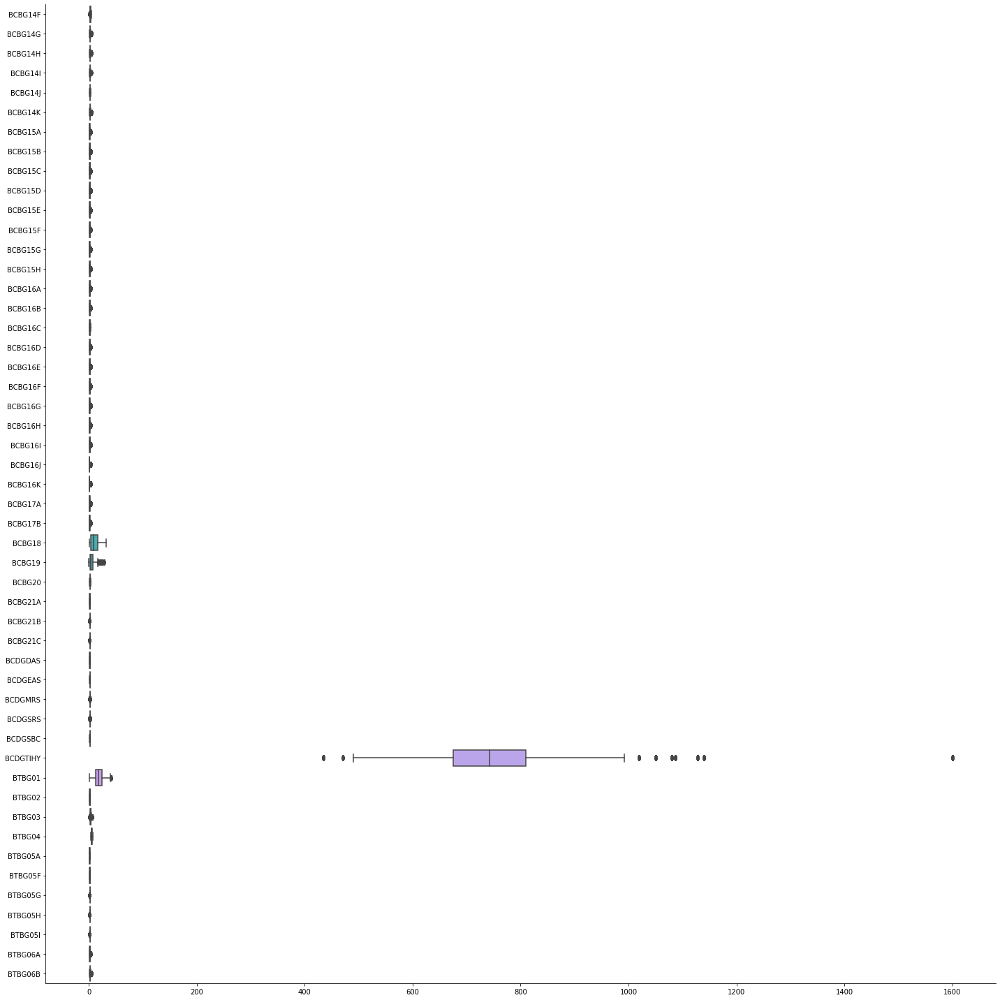

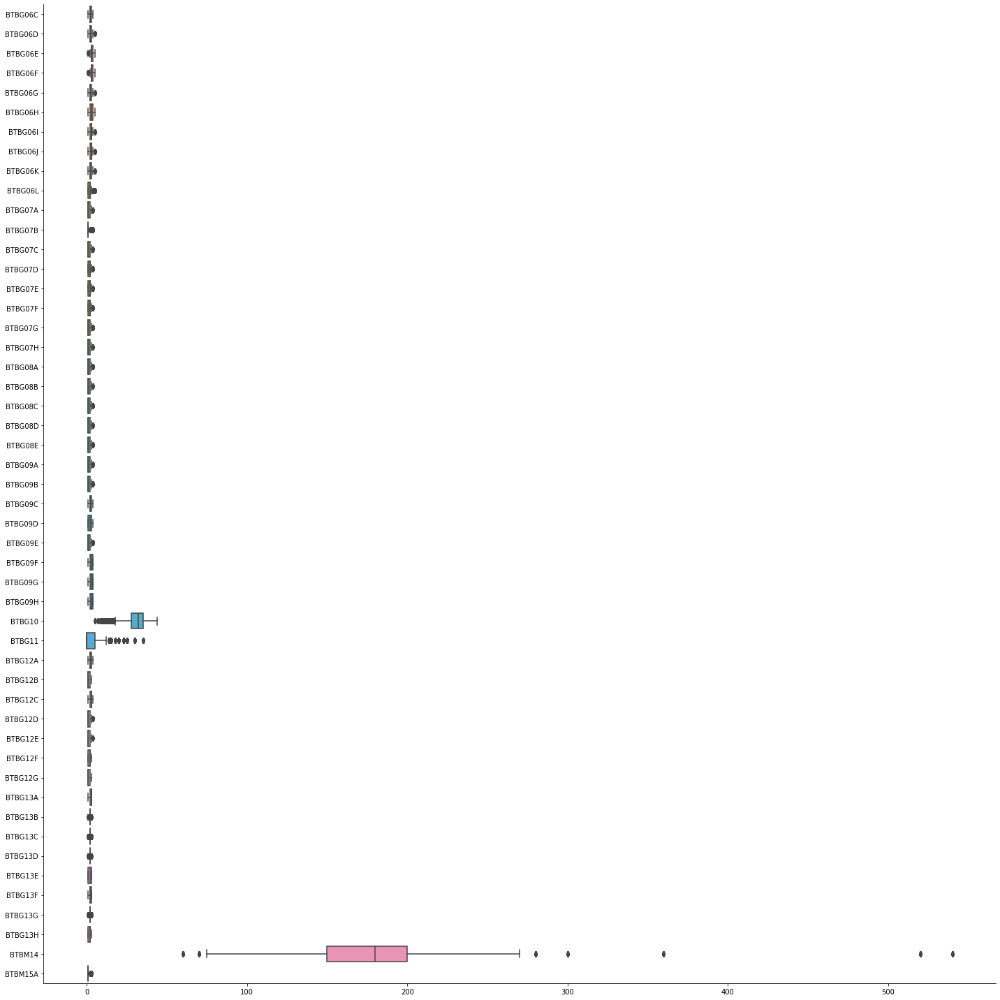

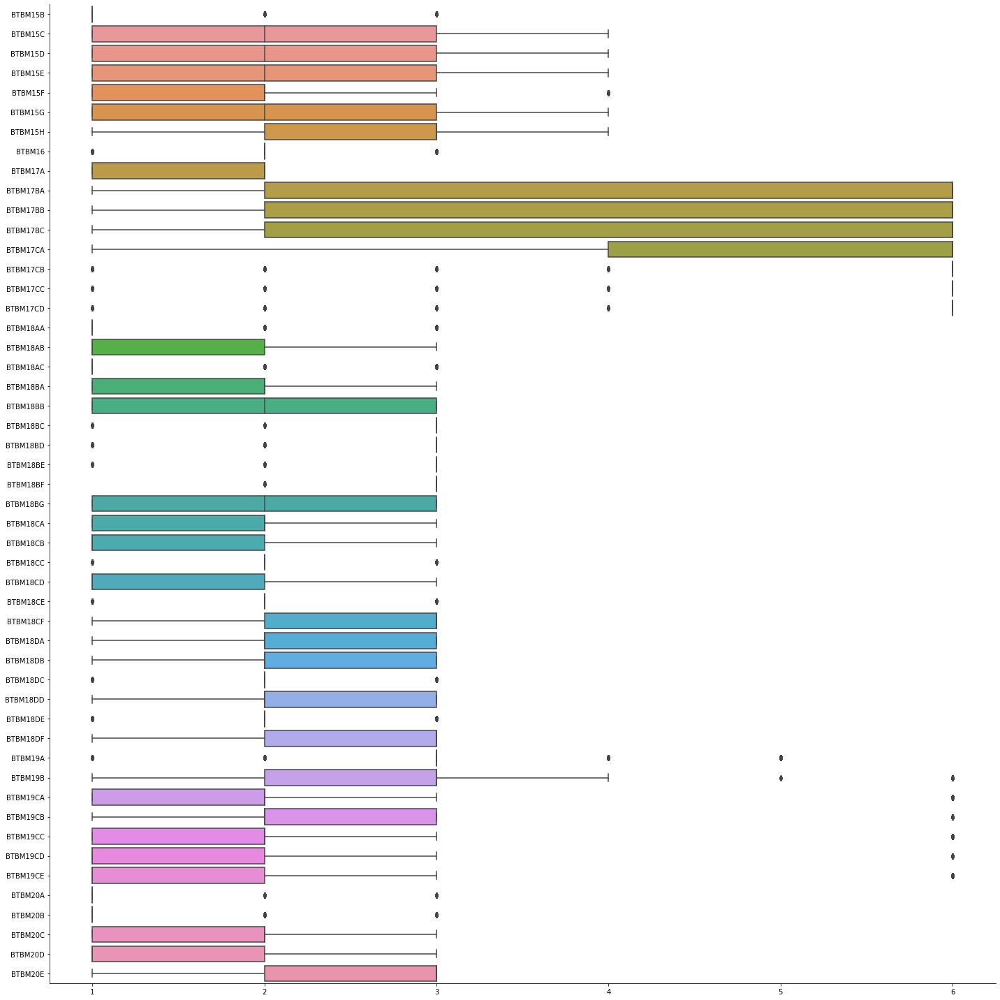

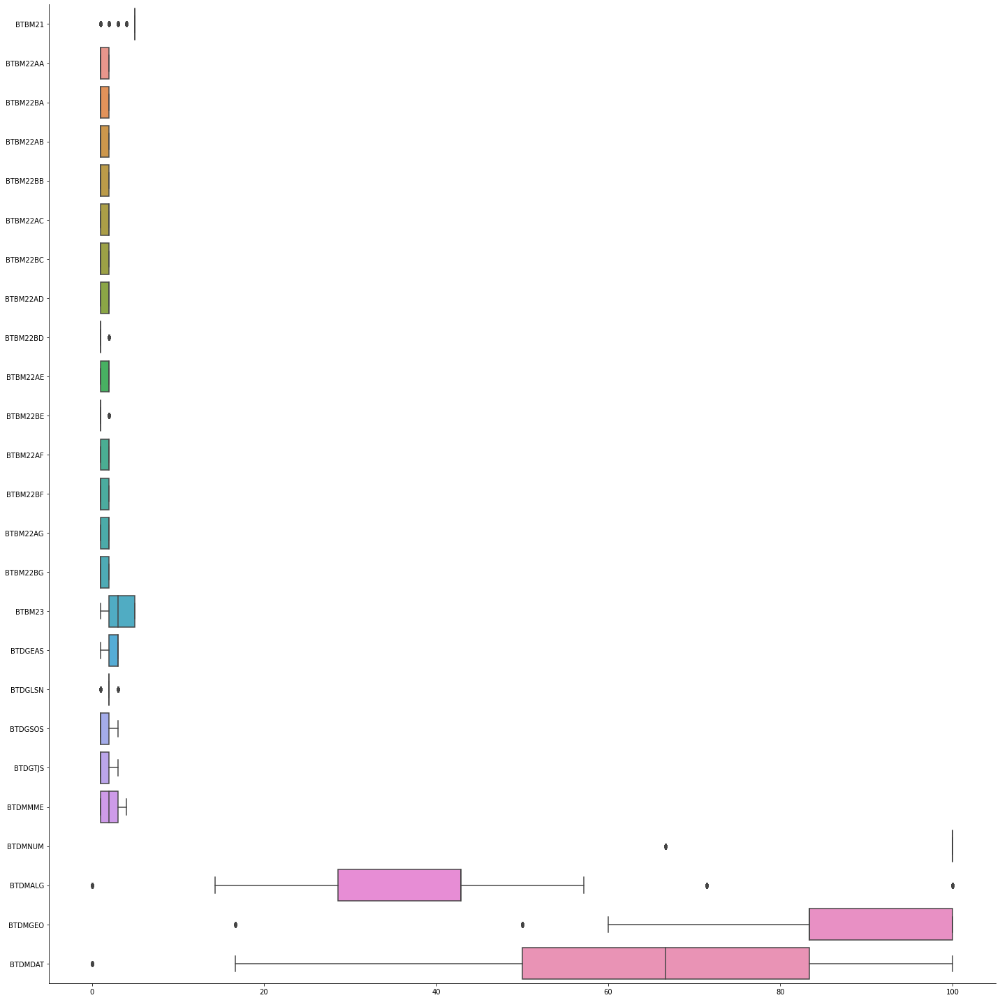

In [5]:
size = len(df.keys())
chunk = 50

for e, i in enumerate(range(0, size, chunk)):
    plt.figure(e, figsize=(20, 20))
    seaborn.catplot(data=df.iloc[:, i + LABEL_END_COL + 1: i + LABEL_END_COL + 1 + chunk], kind="box", orient="h", height=20)

# fill outliers

In [6]:
df_outliers = df.copy()
for col in df_outliers.keys():
    if col in variables_info.keys():
        level = variables_info[col][LEVEL]
        if level == "Nominal":
            continue

        column_values = df_outliers[col]
        q1 = column_values.quantile(1 / 4)
        q3 = column_values.quantile(3 / 4)
        irq = q3 - q1
        upper_whisker = q3 + 1.5 * irq
        lower_whisker = q1 - 1.5 * irq
        lowers = (df_outliers[col] < lower_whisker)
        uppers = (df_outliers[col] > upper_whisker)
        df_outliers[lowers] = df_outliers[df_outliers[col] >= lower_whisker].min()
        df_outliers[uppers] = df_outliers[df_outliers[col] <= upper_whisker].max()

df_outliers

,finalscore,totalscore,finalscorealgebra,finalscoredat,finalscoregeo,finalscorenum,BSBG01,BSBG03,BSBG04,BSBG05A,...,BTBM23,BTDGEAS,BTDGLSN,BTDGSOS,BTDGTJS,BTDMMME,BTDMNUM,BTDMALG,BTDMGEO,BTDMDAT
0,A,0.0,A,A,A,A,1,1,1,1,...,1,1,1,1,1,1,66.66667,0.00000,16.66667,0.00000
1,E,39.0,E,E,E,E,2,4,5,2,...,5,3,3,3,3,4,100.00000,100.00000,100.00000,100.00000
2,E,39.0,E,E,E,E,2,4,5,2,...,5,3,3,3,3,4,100.00000,100.00000,100.00000,100.00000
3,E,6.0,D,E,E,E,1,1,2,2,...,4,2,2,2,2,3,100.00000,28.57143,83.33333,16.66667
4,A,0.0,A,A,A,A,1,1,1,1,...,1,1,1,1,1,1,66.66667,0.00000,16.66667,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5970,D,16.0,D,D,D,D,2,2,2,2,...,2,3,3,1,1,2,100.00000,28.57143,100.00000,83.33333
5971,A,0.0,A,A,A,A,1,1,1,1,...,1,1,1,1,1,1,66.66667,0.00000,16.66667,0.00000
5972,E,7.0,E,E,D,E,1,3,2,1,...,5,3,2,2,1,2,100.00000,71.42857,100.00000,83.33333
5973,E,39.0,E,E,E,E,2,4,5,2,...,5,3,3,3,3,4,100.00000,100.00000,100.00000,100.00000


# normalize dataset


In [7]:
z_score = lambda df: (df - df.mean()) / df.std(ddof=0)

cols = []
for col in df.keys():
    if col in variables_info and variables_info[col][LEVEL] in ("Scale", "Ratio"):
        cols.append(col)

df[cols] = z_score(df[cols])

cols = []
for col in df.keys():
    if col in variables_info and variables_info[col][LEVEL] == "Ordinal":
        cols.append(col)
        
ordinals = df[(c for c in df.columns if c in cols)]
df[cols] = (ordinals - 1) / (ordinals.max() - 1)
df

,finalscore,totalscore,finalscorealgebra,finalscoredat,finalscoregeo,finalscorenum,BSBG01,BSBG03,BSBG04,BSBG05A,...,BTBM23,BTDGEAS,BTDGLSN,BTDGSOS,BTDGTJS,BTDMMME,BTDMNUM,BTDMALG,BTDMGEO,BTDMDAT
0,D,14.0,A,D,E,E,1,0.333333,0.50,1,...,5,1.0,0.5,0.0,0.0,0.333333,0.237208,-0.633480,-0.151747,0.679773
1,D,11.0,D,D,E,D,1,0.000000,0.50,1,...,5,1.0,0.5,0.0,0.0,0.333333,0.237208,-0.633480,-0.151747,0.679773
2,B,31.0,B,D,C,B,1,0.000000,0.75,1,...,5,1.0,0.5,0.0,0.0,0.333333,0.237208,-0.633480,-0.151747,0.679773
3,E,6.0,D,E,E,E,1,0.000000,0.25,2,...,4,0.5,0.5,0.5,0.5,0.666667,0.237208,-0.633480,-0.151747,-1.656097
4,D,15.0,D,C,E,D,1,0.000000,0.25,1,...,4,0.5,0.5,0.5,0.5,0.666667,0.237208,-0.633480,-0.151747,-1.656097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5970,D,16.0,D,D,D,D,2,0.333333,0.25,2,...,2,1.0,1.0,0.0,0.0,0.333333,0.237208,-0.633480,1.239968,0.679773
5971,D,9.0,E,E,C,E,1,1.000000,0.00,2,...,5,1.0,0.5,0.5,0.0,0.333333,0.237208,2.109554,1.239968,0.679773
5972,E,7.0,E,E,D,E,1,0.666667,0.25,1,...,5,1.0,0.5,0.5,0.0,0.333333,0.237208,2.109554,1.239968,0.679773
5973,D,9.0,E,E,C,E,2,0.000000,1.00,1,...,4,1.0,1.0,0.5,1.0,0.333333,0.237208,-1.547825,-0.151747,0.095805


In [8]:
# some helper function
convert = lambda df: df.replace({old: new for old, new in zip("ABCDE", [5, 4, 3, 2, 1])})
split = lambda df: (df.iloc[:, LABEL_END_COL + 1:],
                    df.iloc[:, :LABEL_END_COL + 1])

array([[<AxesSubplot:title={'center':'finalscore'}>,
        <AxesSubplot:title={'center':'totalscore'}>],
       [<AxesSubplot:title={'center':'finalscorealgebra'}>,
        <AxesSubplot:title={'center':'finalscoredat'}>],
       [<AxesSubplot:title={'center':'finalscoregeo'}>,
        <AxesSubplot:title={'center':'finalscorenum'}>]], dtype=object)

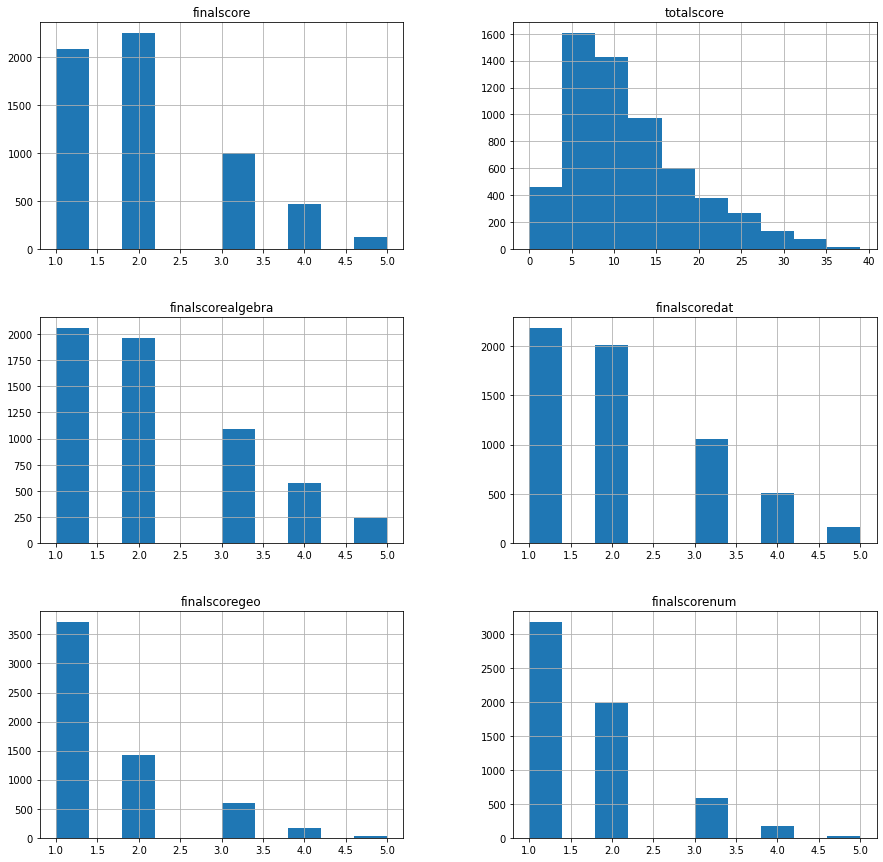

In [21]:
xs, ys = split(df)
new_ys = convert(ys)
new_ys.hist(figsize=(15,15))

# Analysis

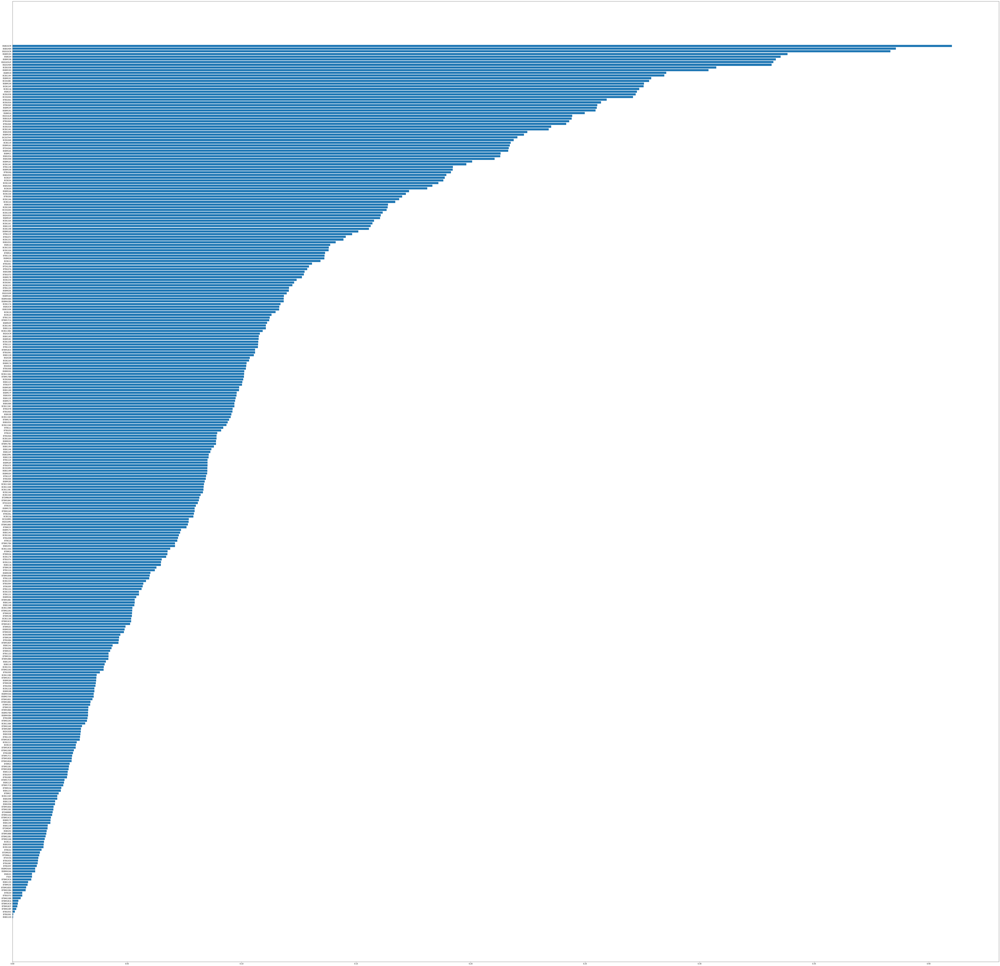

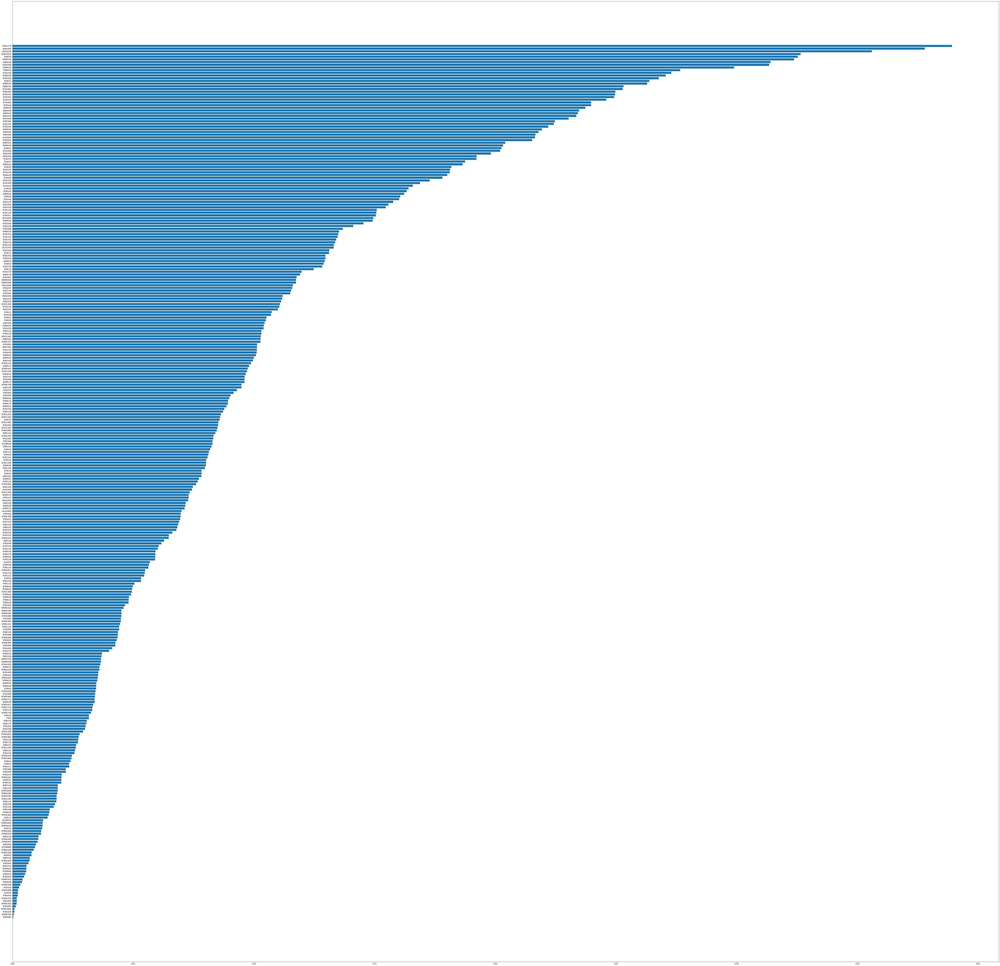

In [9]:
# final score correlations
scores = SCORES + FIELDS

for method in CORRELATION_METHODS:
        corrs = convert(df).corr(method=method)["finalscore"].map(abs)
        values = corrs.drop(scores, axis=0).values
        columns = values.argsort()
        plot_df = df.drop(scores, axis=1)
        plt.figure(figsize=(100, 100))
        plt.barh(plot_df.columns[columns], values[columns])

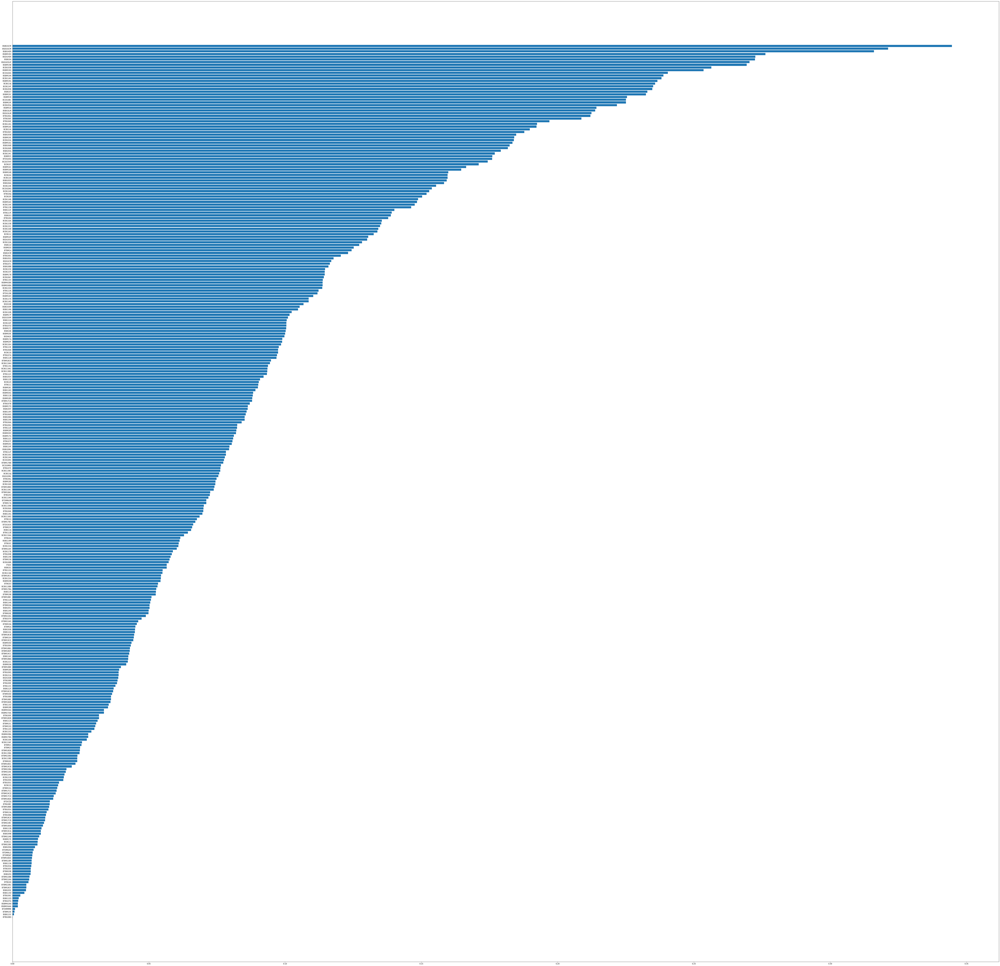

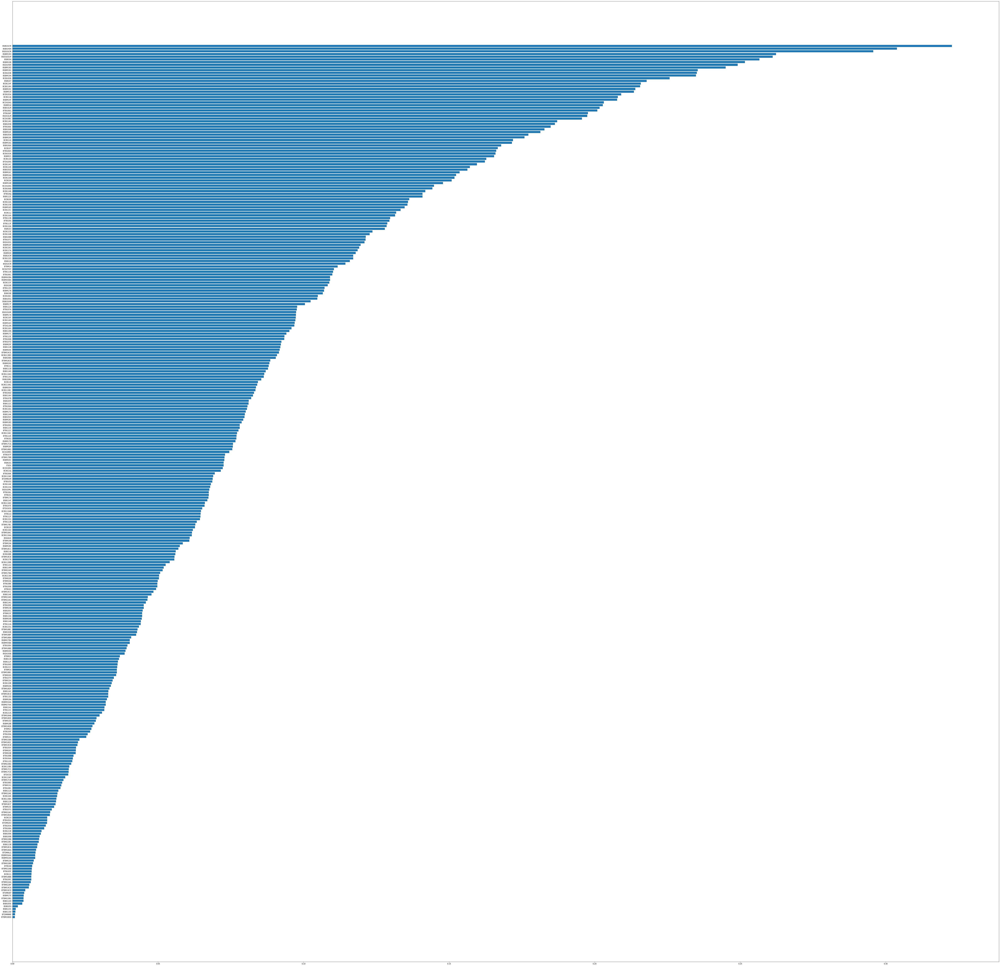

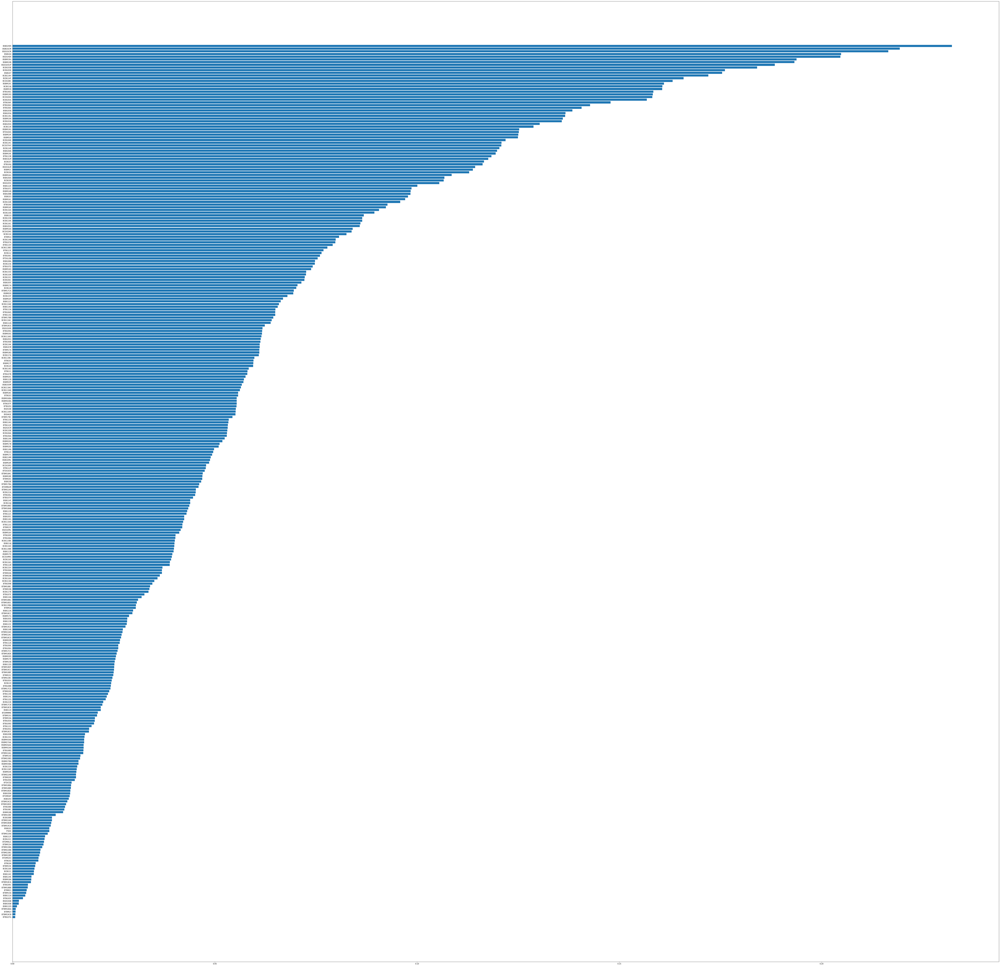

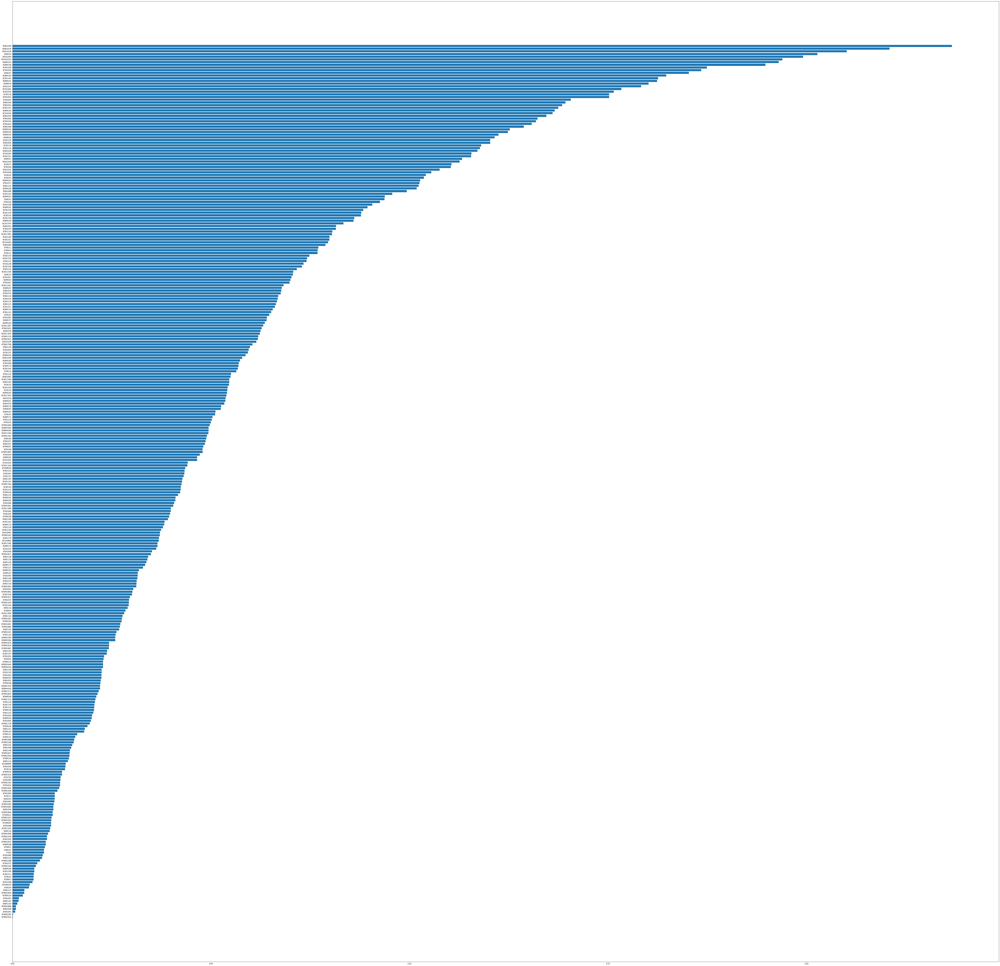

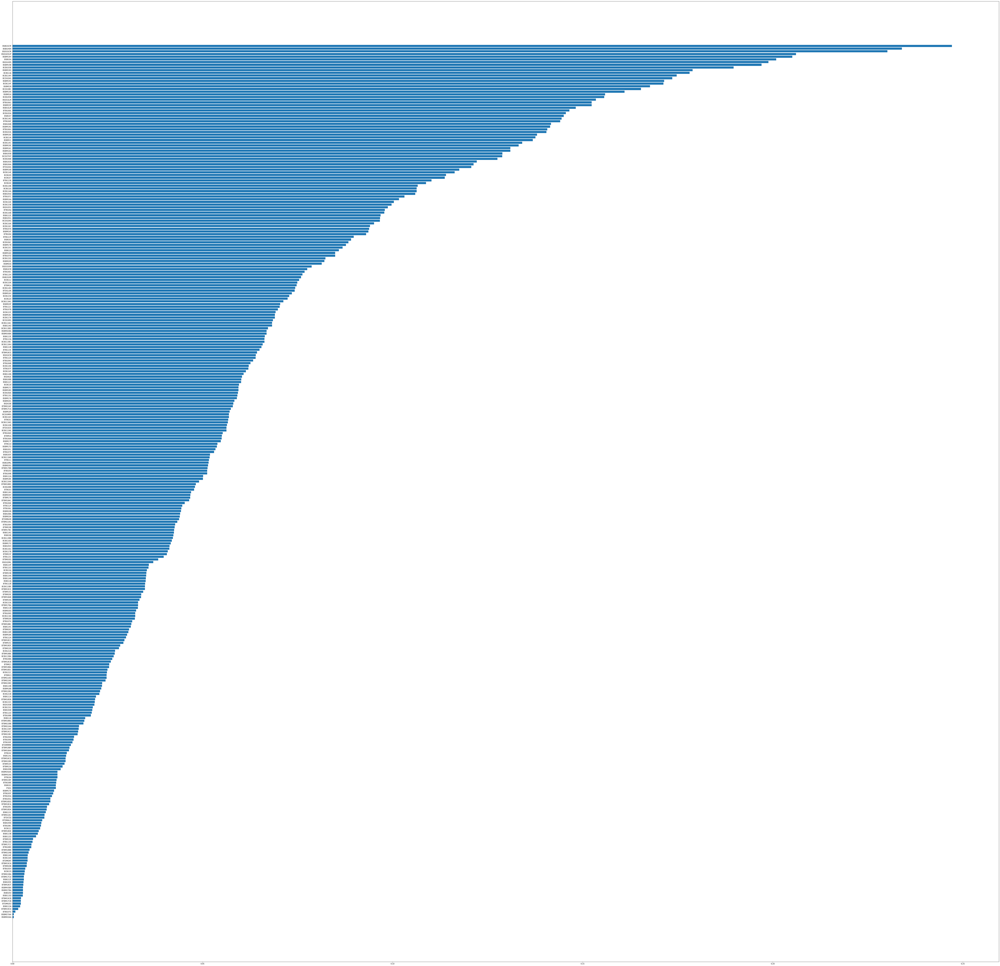

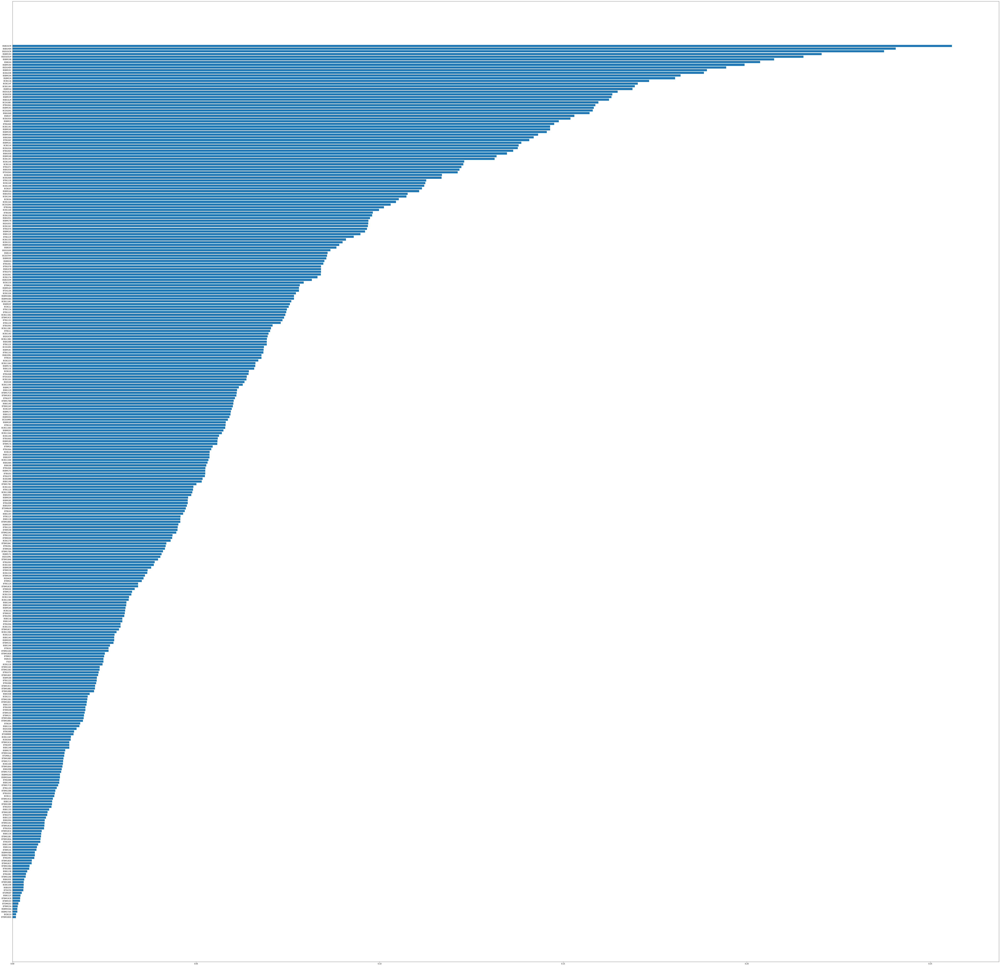

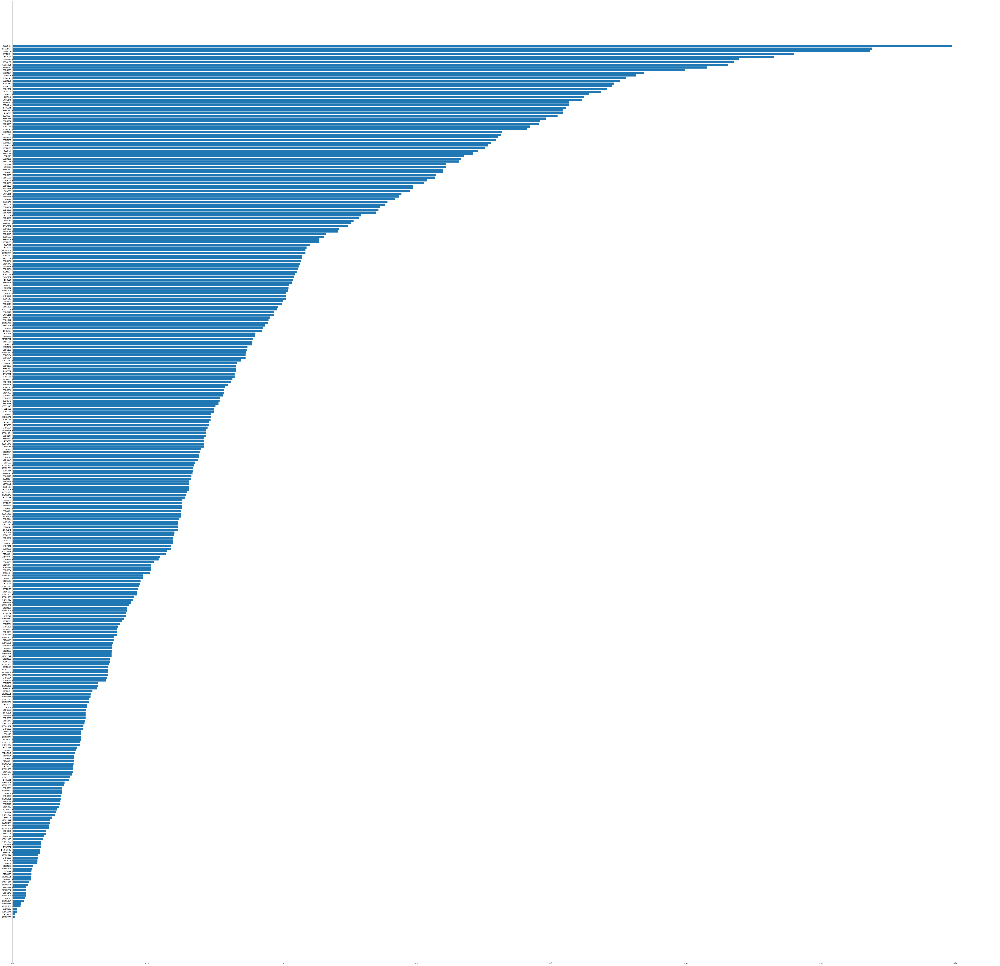

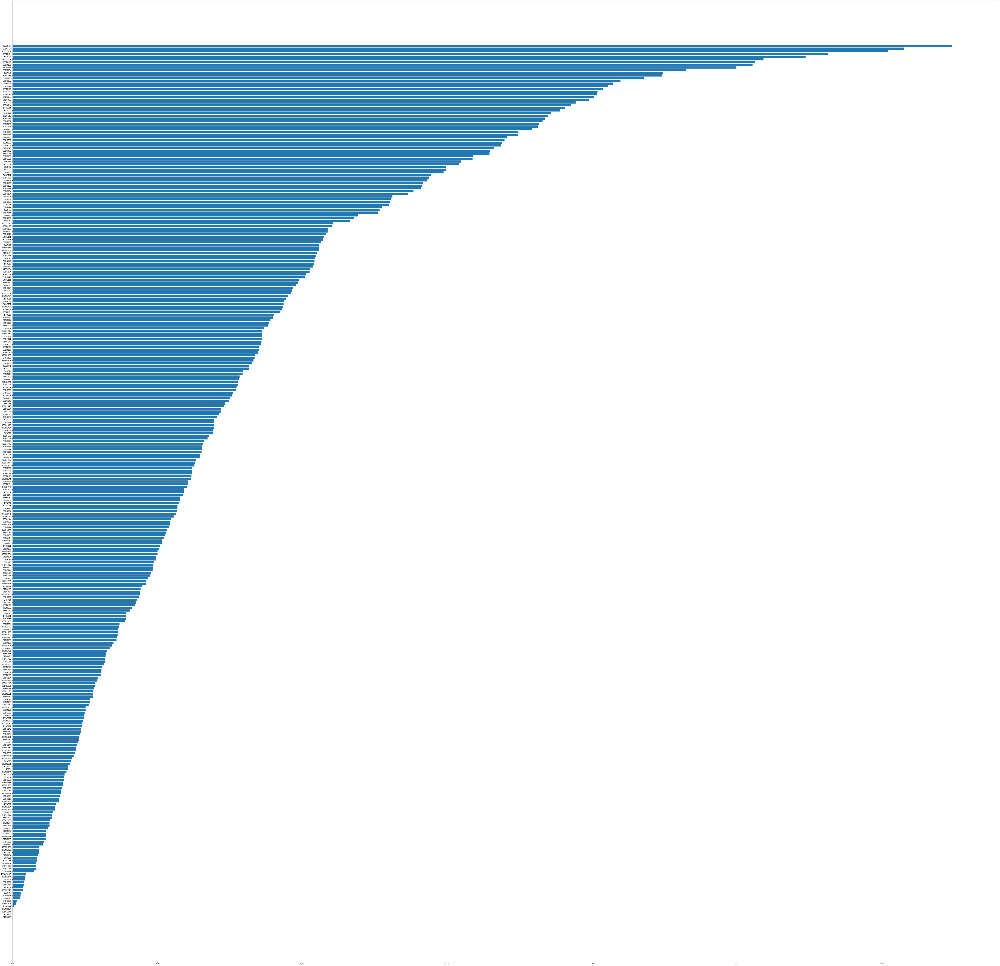

In [10]:
# field scores correlations
scores = SCORES + FIELDS

for field in FIELDS:
        for method in CORRELATION_METHODS:
                corrs = convert(df).corr(method=method)[field].map(abs)
                values = corrs.drop(scores, axis=0).values
                columns = values.argsort()
                plot_df = df.drop(scores, axis=1)
                plt.figure(figsize=(100, 100))
                plt.barh(plot_df.columns[columns], values[columns])

In [11]:
# paritition dataset to male and female dataframes
temp = convert(df)
male_df = temp[temp["ITSEX"] == 2]
female_df = temp[temp["ITSEX"] == 1]


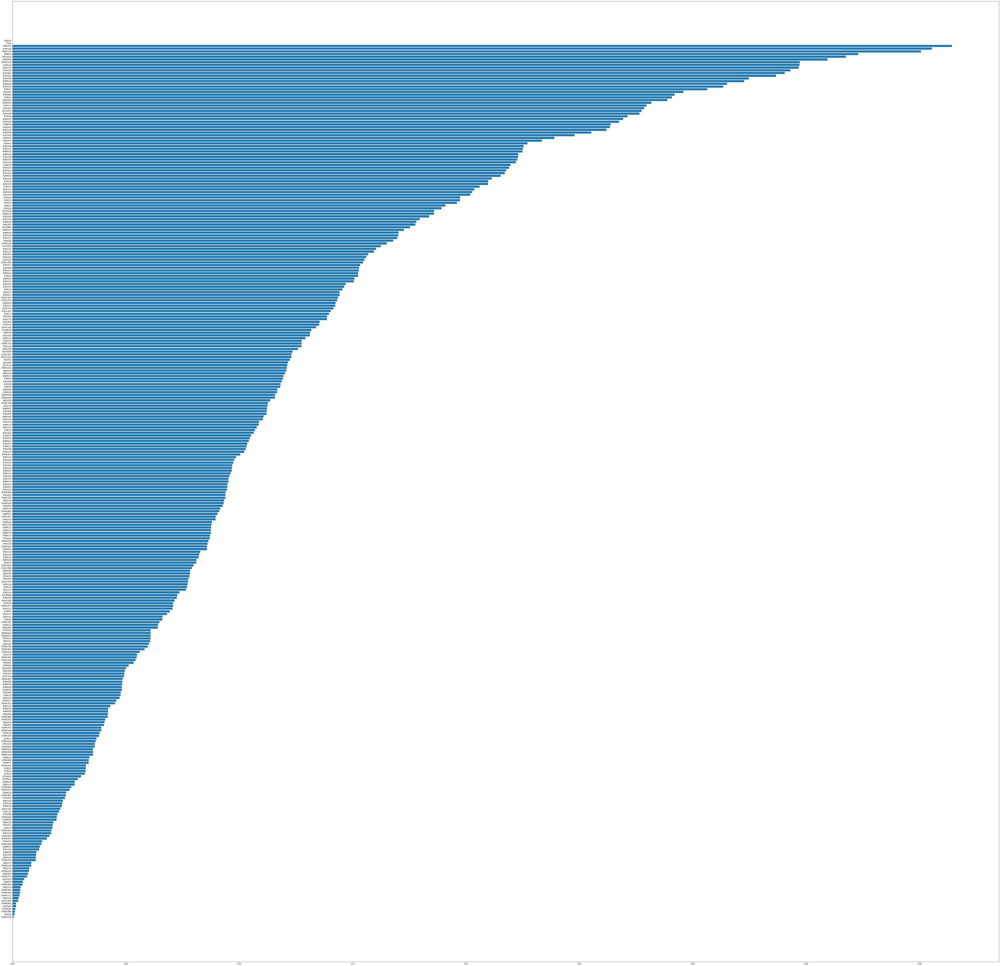

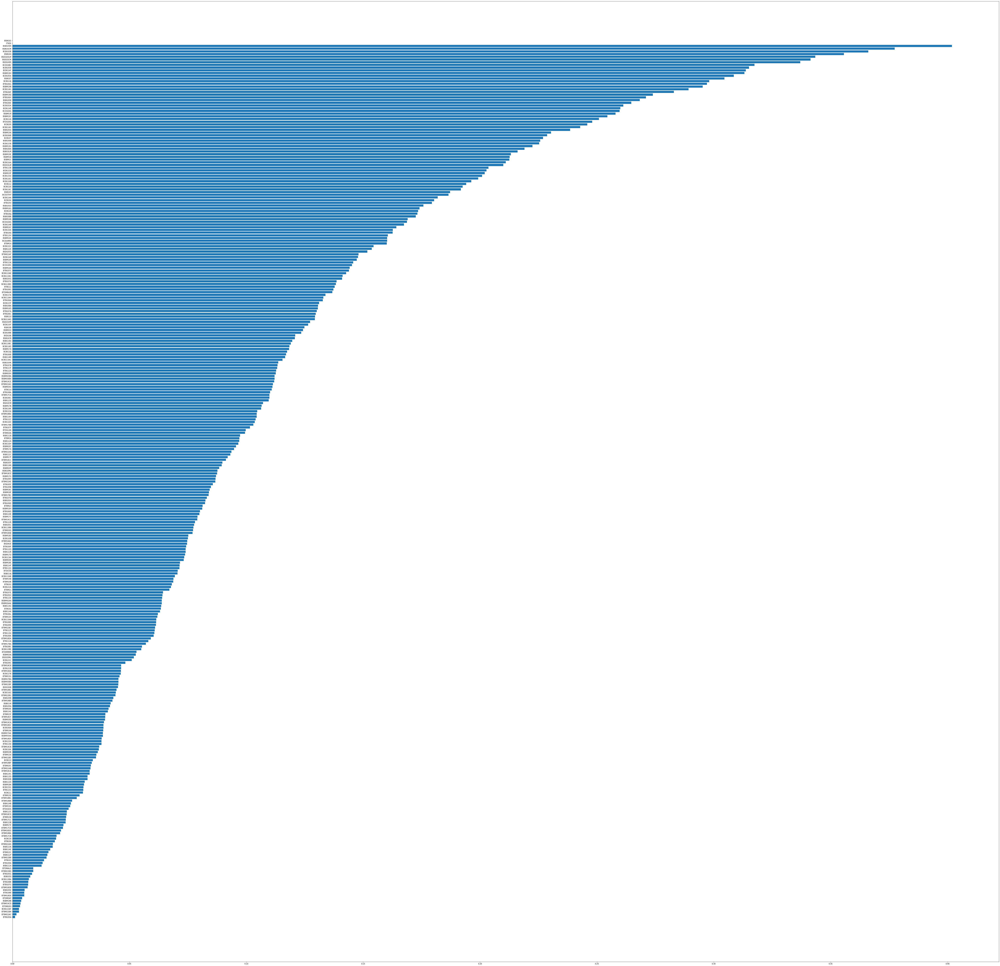

In [12]:
# male's finalscore correlations
scores = FIELDS + SCORES

for method in CORRELATION_METHODS:
        corrs = convert(male_df).corr(method=method)["finalscore"].map(abs)
        values = corrs.drop(scores, axis=0).values
        columns = values.argsort()
        plot_df = male_df.drop(scores, axis=1)
        plt.figure(figsize=(100, 100))
        plt.barh(plot_df.columns[columns], values[columns])

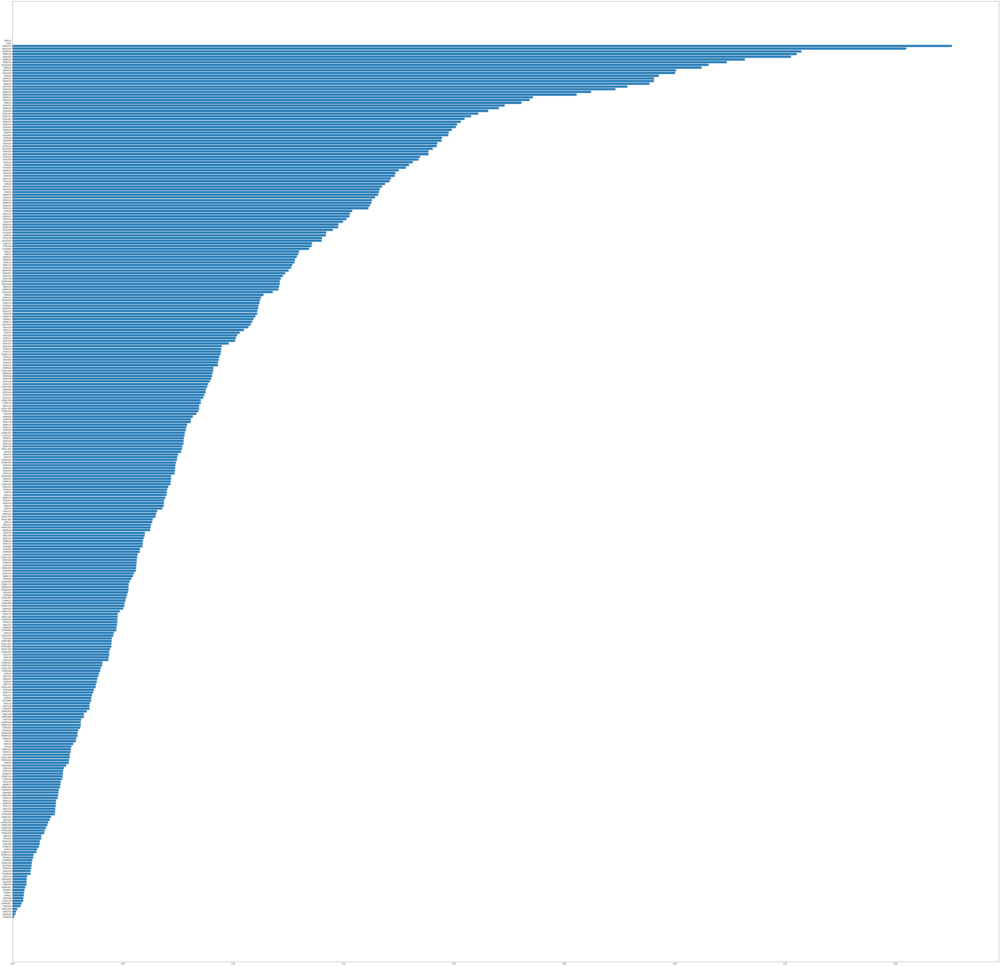

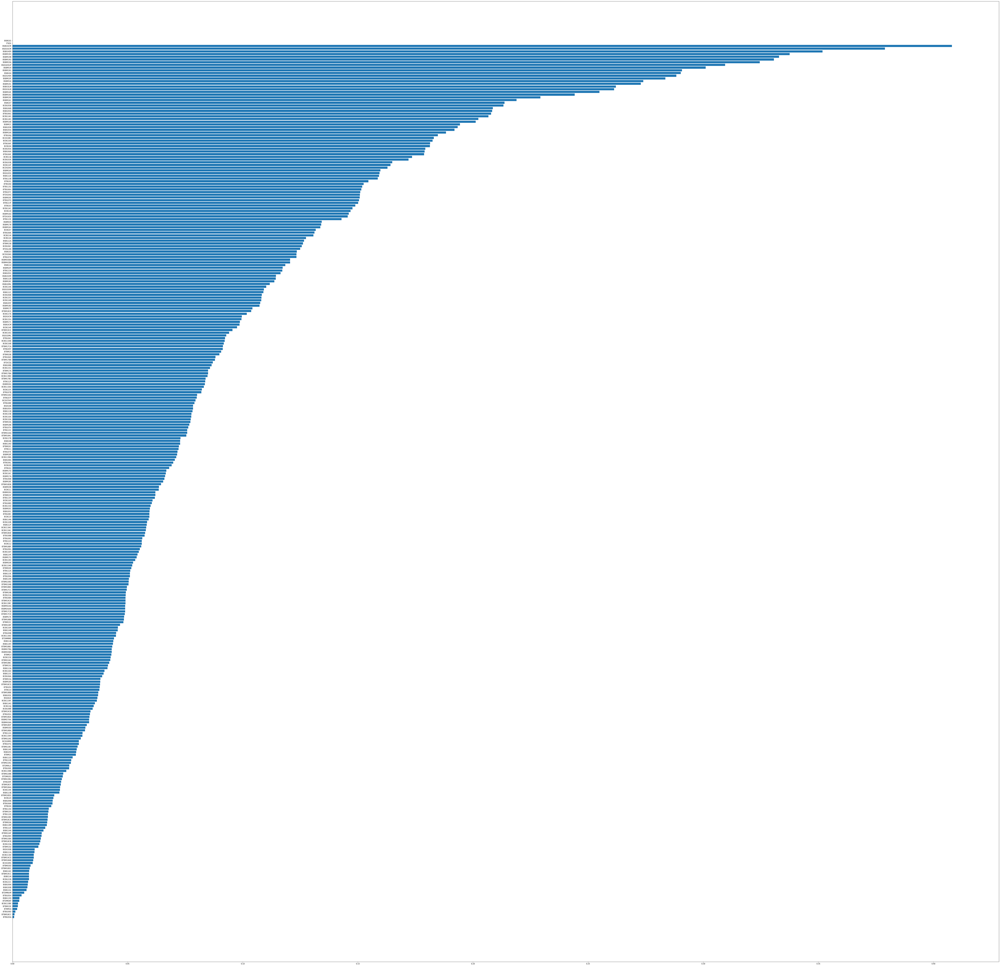

In [13]:
# female's finalscore correlations
scores = SCORES + FIELDS
for method in CORRELATION_METHODS:
        corrs = convert(female_df).corr(method=method)["finalscore"].map(abs)
        values = corrs.drop(scores, axis=0).values
        columns = values.argsort()
        plot_df = female_df.drop(scores, axis=1)
        plt.figure(figsize=(100, 100))
        plt.barh(plot_df.columns[columns], values[columns])

In [14]:
def dt_fi(xs, ys):
    dt = DecisionTreeRegressor()
    dt.fit(xs.values, ys.values)
    return dt.feature_importances_

<BarContainer object of 325 artists>

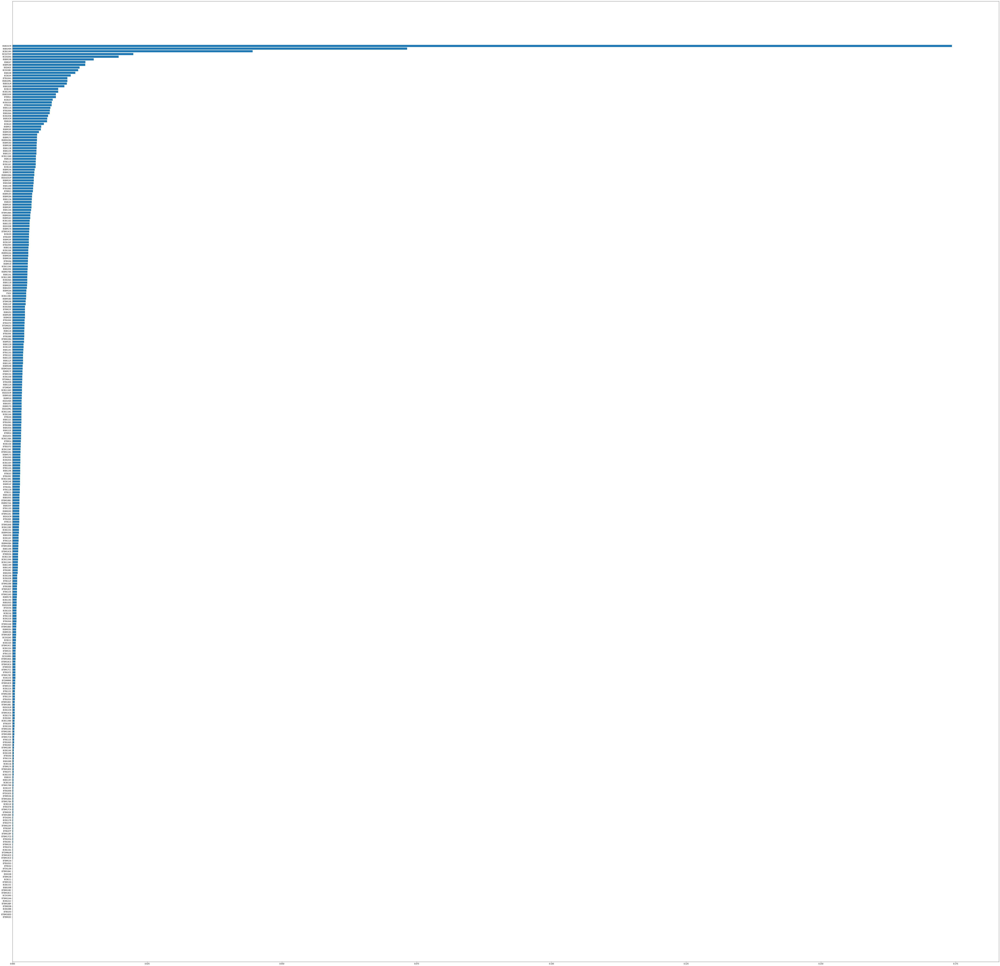

In [15]:
# finalscore feature importance
xs, ys = split(convert(df))
fi = dt_fi(xs, ys["finalscore"])

columns = fi.argsort()
plt.figure(figsize=(100, 100))
plt.barh(xs.columns[columns], fi[columns])

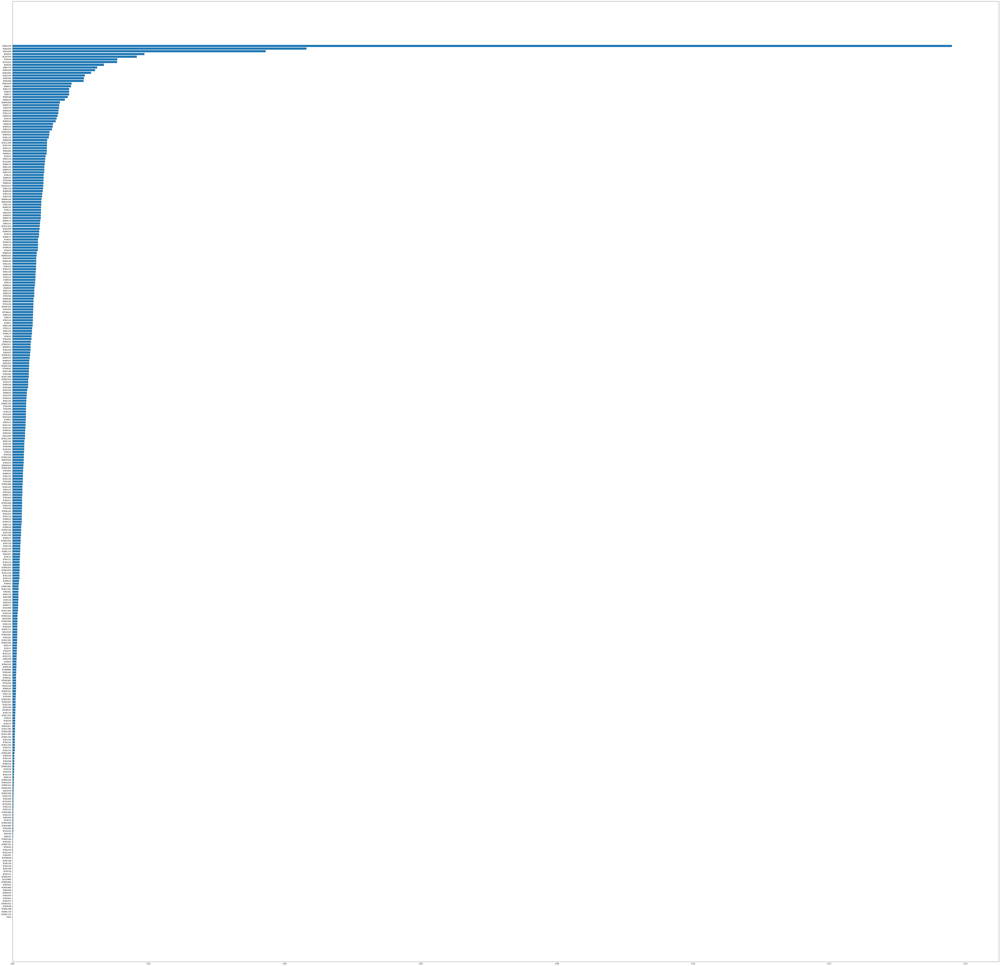

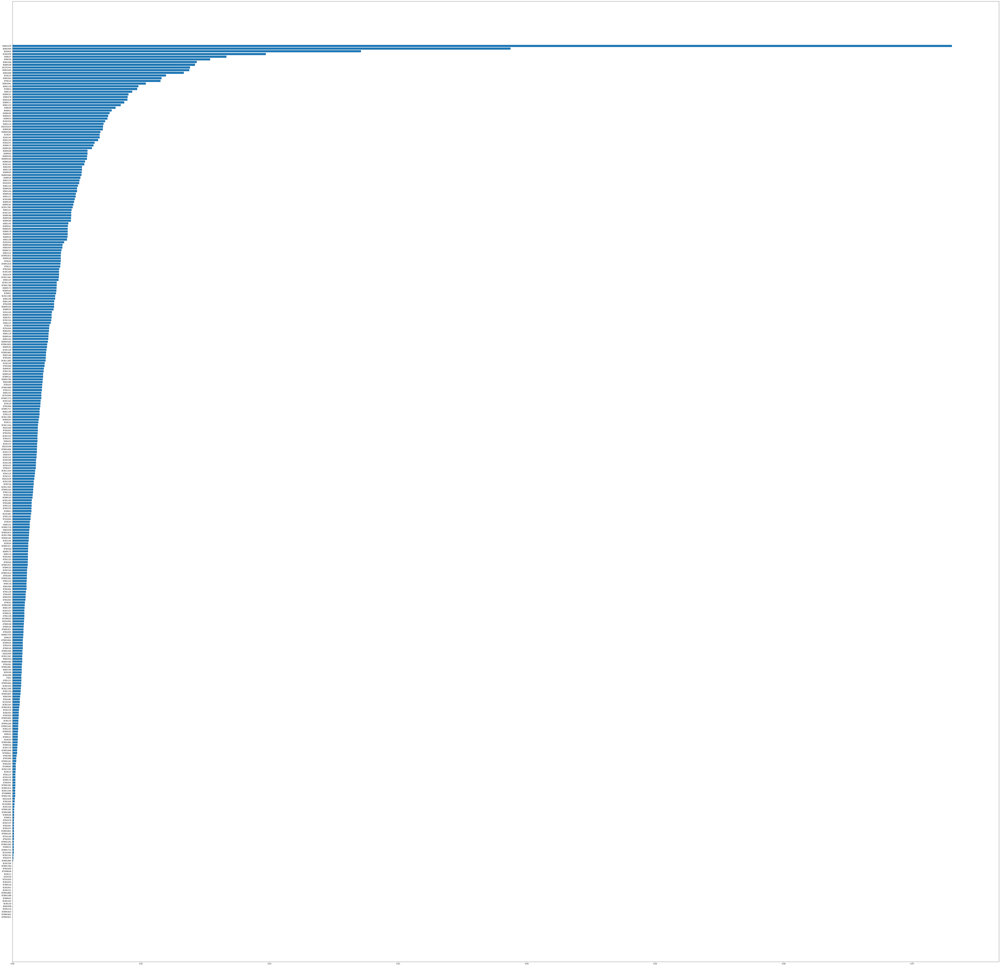

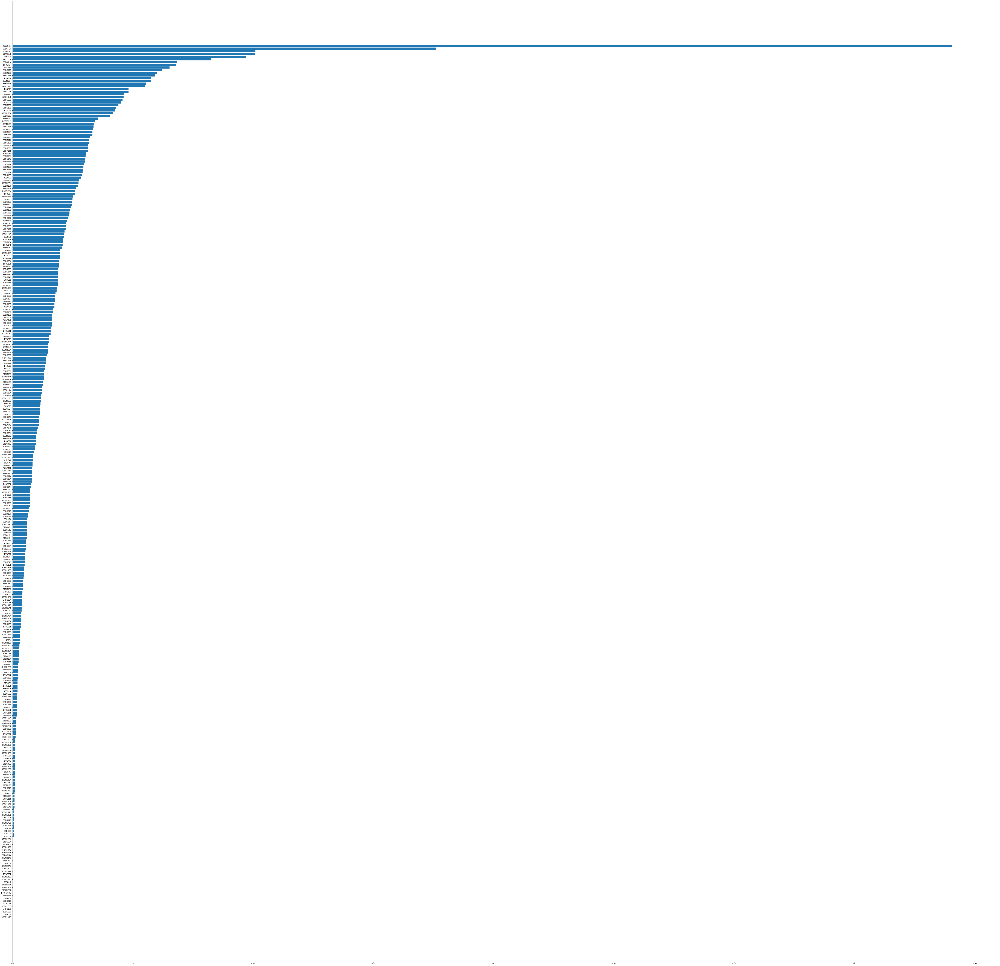

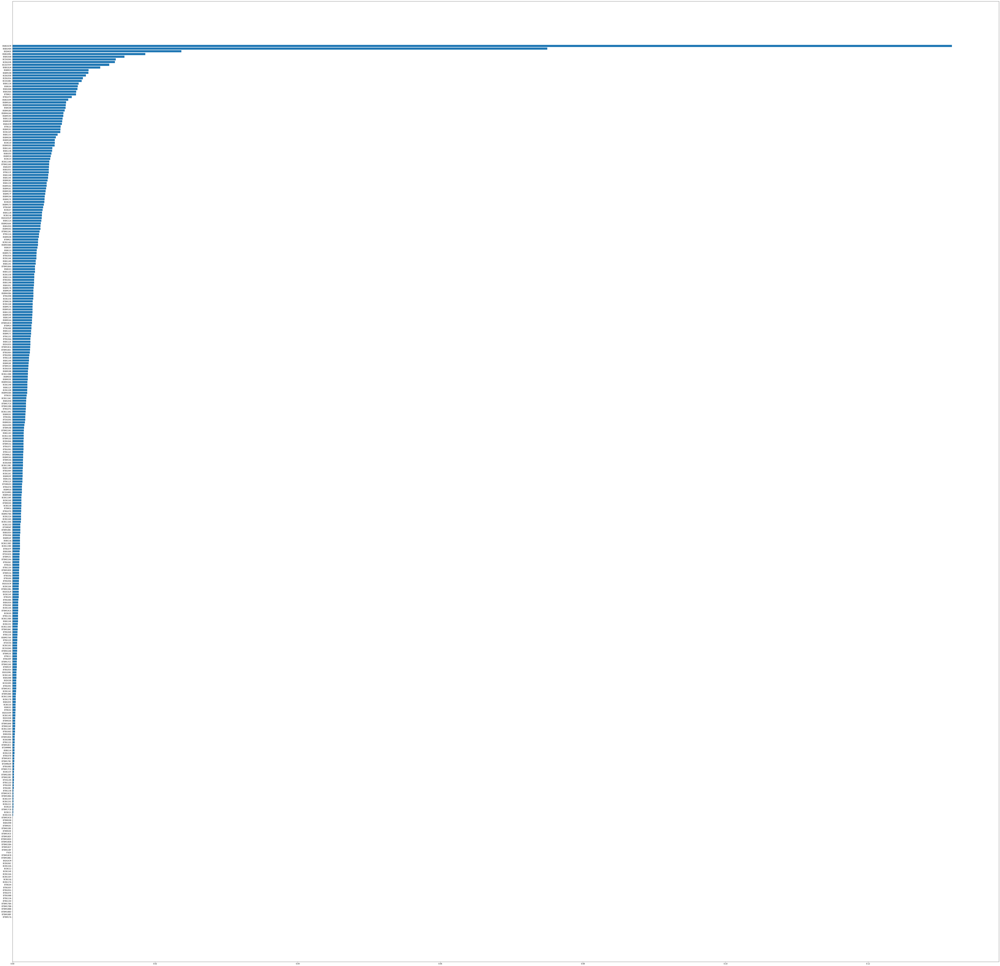

In [16]:
xs, ys = split(convert(df))

for field in FIELDS:
    fi = dt_fi(xs, ys[field])
    columns = fi.argsort()
    plt.figure(figsize=(100, 100))
    plt.barh(xs.columns[columns], fi[columns])

<BarContainer object of 325 artists>

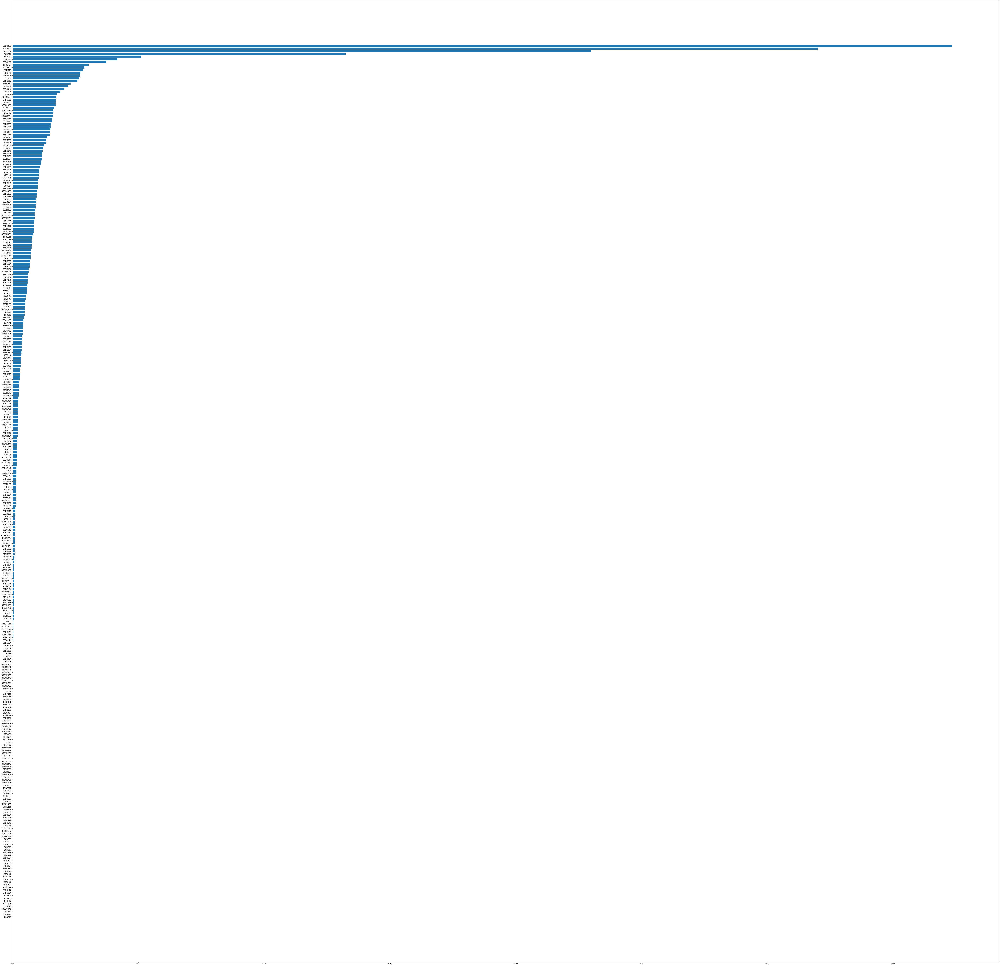

In [17]:
xs_male, ys_male = split(male_df)


fi = dt_fi(xs_male, ys_male["finalscore"])
columns = fi.argsort()
plt.figure(figsize=(100, 100))
plt.barh(xs_male.columns[columns], fi[columns])

<BarContainer object of 325 artists>

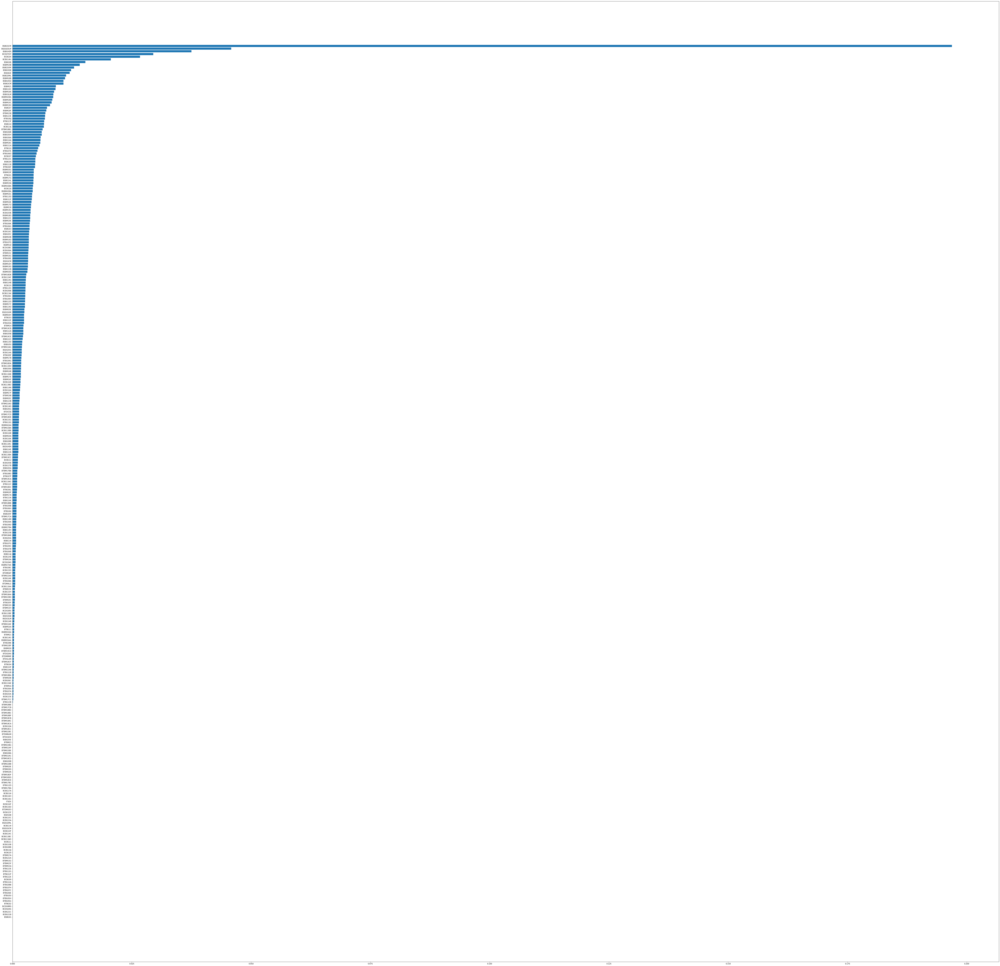

In [18]:

xs_female, ys_female = split(female_df)

fi = dt_fi(xs_female, ys_female["finalscore"])
columns = fi.argsort()
plt.figure(figsize=(100, 100))
plt.barh(xs_female.columns[columns], fi[columns])